In [ ]:
# Refactored code here
# Importing necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
import albumentations as A
from sklearn.metrics import confusion_matrix
from transformers import EvalPrediction, TrainingArguments, Trainer
from transformers import AutoImageProcessor, MaskFormerForInstanceSegmentation,MaskFormerImageProcessor 
import albumentations as A

from torch.optim import Adam
from torch.nn import CrossEntropyLoss
from torchvision.transforms import functional as F
from newloader import Crack_loader

In [ ]:
valid_dataset = Crack_loader(img_dir=DIR_IMG_val, img_fnames=img_names_val, mask_dir=DIR_MASK_val,
                              mask_fnames=mask_names_val, resize=True)

In [385]:
from datasets import Dataset, DatasetDict, Image
import os

def get_paths(directory, file_extensions):
    """
    Returns a list of paths to files in 'directory' that end with one of the 'file_extensions'.
    
    :param directory: Directory to search for files.
    :param file_extensions: Tuple of acceptable file extensions.
    :return: List of file paths.
    """
    all_files = os.listdir(directory)
    return [os.path.join(directory, f) for f in all_files if f.lower().endswith(file_extensions)]

# Usage example

def create_dataset(image_paths, label_paths):
    dataset = Dataset.from_dict({"pixel_values": sorted(image_paths),
                                 "label": sorted(label_paths)})
    dataset = dataset.cast_column("pixel_values", Image())
    dataset = dataset.cast_column("label", Image())
    return dataset

# Replace 'train_image_dir' and 'train_label_dir' with your actual directory paths
train_image_dir = r"C:\Users\skoka3\Desktop\CIVE-FP\test_train_valid\train\images"
train_label_dir = r"C:\Users\skoka3\Desktop\CIVE-FP\test_train_valid\train\coarse"

# Same for validation
validation_image_dir = r"C:\Users\skoka3\Desktop\CIVE-FP\test_train_valid\val\images"
validation_label_dir = r"C:\Users\skoka3\Desktop\CIVE-FP\test_train_valid\val\coarse"

image_extensions = (".jpg", ".jpeg", ".png")  # Add or remove extensions as needed
image_paths_train = get_paths(train_image_dir, image_extensions)
label_paths_train = get_paths(train_label_dir, (".png",))  # Assuming labels are in .png format

image_paths_validation = get_paths(validation_image_dir, image_extensions)  # or ".png"
label_paths_validation = get_paths(validation_label_dir, ".png")

# Create Dataset objects
train_dataset = create_dataset(image_paths_train, label_paths_train)
validation_dataset = create_dataset(image_paths_validation, label_paths_validation)



# Create DatasetDict
dataset = DatasetDict({
    "train": train_dataset,
    "validation": validation_dataset,
})

# Now, 'dataset' contains your training and validation datasets


In [386]:
dataset

DatasetDict({
    train: Dataset({
        features: ['pixel_values', 'label'],
        num_rows: 782
    })
    validation: Dataset({
        features: ['pixel_values', 'label'],
        num_rows: 223
    })
})

In [387]:
train_ds = dataset["train"]
test_ds = dataset["validation"]

In [383]:
train_ds[10]

{'pixel_values': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1360x2048>,
 'label': <PIL.PngImagePlugin.PngImageFile image mode=P size=1360x2048>}

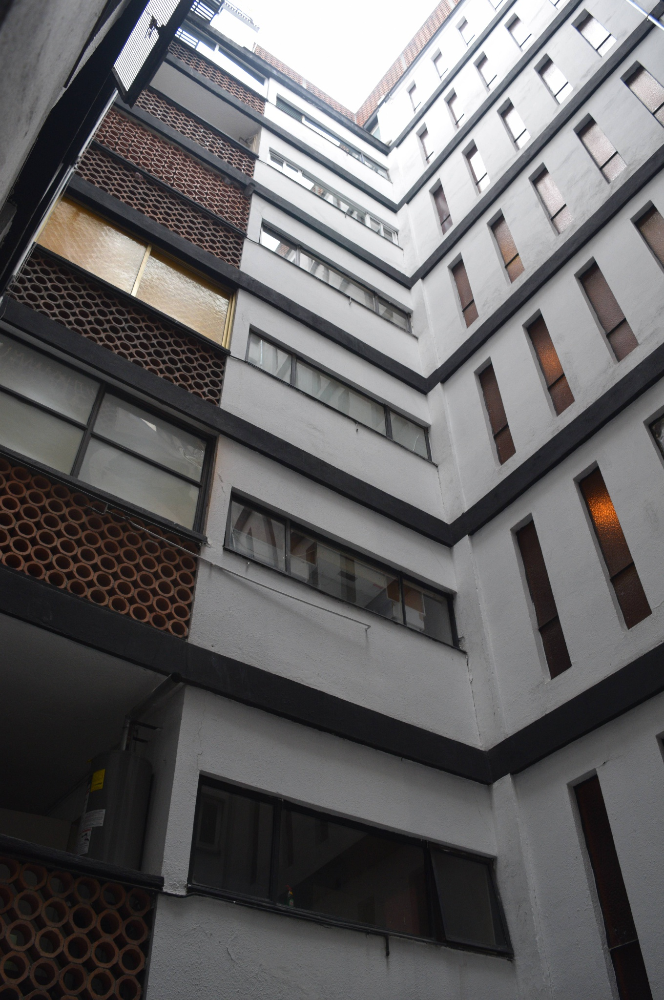

In [125]:
# let's look at one example (images are pretty high resolution)
example = train_ds[55]
image = example['pixel_values']
image

In [126]:
import numpy as np

# load corresponding ground truth segmentation map, which includes a label per pixel
segmentation_map = np.array(example['label'])
segmentation_map +=1
segmentation_map

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [127]:
np.unique(segmentation_map)

array([1, 7], dtype=uint8)

In [128]:
# Corresponding id2label mapping
id2label = {
    1: "No",
    2: "Shadows",
    3: "Dirt",
    4: "Vegetative Growth",
    5: "Debris",
    6: "Marks",
    7: "Spalling",
    8: "Voids"
}

# Display the id2label mapping
print(id2label)


{1: 'No', 2: 'Shadows', 3: 'Dirt', 4: 'Vegetative Growth', 5: 'Debris', 6: 'Marks', 7: 'Spalling', 8: 'Voids'}


In [129]:
labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

['No', 'Spalling']


In [130]:
def custom_color_palette():
    """Custom color palette that maps each class to RGB values."""
    return [
        [0, 0, 0],          # No - black
        [128, 128, 128],    # Shadows - grey
        [218, 165, 32],     # Dirt - goldenrod
        [0, 255, 127],      # Vegetative Growth - springgreen
        [255, 0, 255],      # Debris - fuchsia
        [128, 0, 128],      # Marks - purple
        [255, 99, 71],      # Spalling - tomato
        [255, 255, 0]       # Voids - yellow
    ]

# Usage
palette = custom_color_palette()
print(palette)


[[0, 0, 0], [128, 128, 128], [218, 165, 32], [0, 255, 127], [255, 0, 255], [128, 0, 128], [255, 99, 71], [255, 255, 0]]


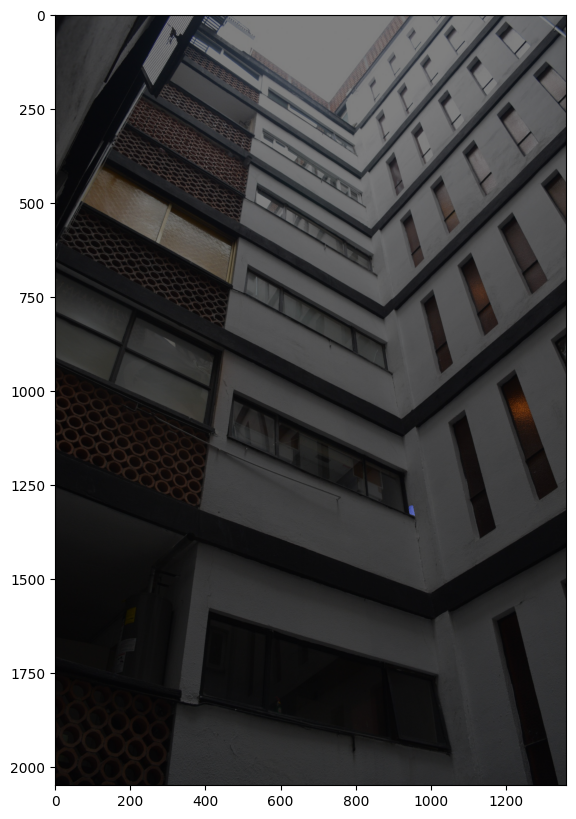

In [131]:
import numpy as np
import matplotlib.pyplot as plt

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map-1 == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

## creating the Dataset, and augmentation of the data

In [223]:
import numpy as np
from torch.utils.data import Dataset

class ImageSegmentationDataset(Dataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset: The input dataset.
            transform: Transformations to be applied to images and masks.
        """
        self.dataset = dataset
        self.transform = transform
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        original_image = np.array(self.dataset[idx]['pixel_values'])
        original_segmentation_map = np.array(self.dataset[idx]['label'])

        # Add 1 to the segmentation map labels
        original_segmentation_map += 1

        # Apply transformations
        transformed = self.transform(image=original_image, mask=original_segmentation_map)
        image, segmentation_map = transformed['image'], transformed['mask']

        # Convert to C, H, W
        image = image.transpose(2,0,1)

        return image, segmentation_map, original_image, original_segmentation_map


In [224]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

train_transform = A.Compose([
    A.LongestMaxSize(max_size=1333),
    A.RandomCrop(width=512, height=512),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
])

test_transform = A.Compose([
    A.Resize(width=512, height=512),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),

])

train_dataset = ImageSegmentationDataset(train_ds, transform=train_transform)
test_dataset = ImageSegmentationDataset(test_ds, transform=test_transform)

In [225]:
train_dataset[0][0].shape

(3, 512, 512)

In [226]:
test_dataset[0][0].shape

(3, 512, 512)

In [227]:
print(len(train_ds))
print(len(test_ds))


782
223


In [228]:
image, segmentation_map, _, _ = test_dataset[0]
print(image.shape)
print(segmentation_map.shape)

(3, 512, 512)
(512, 512)


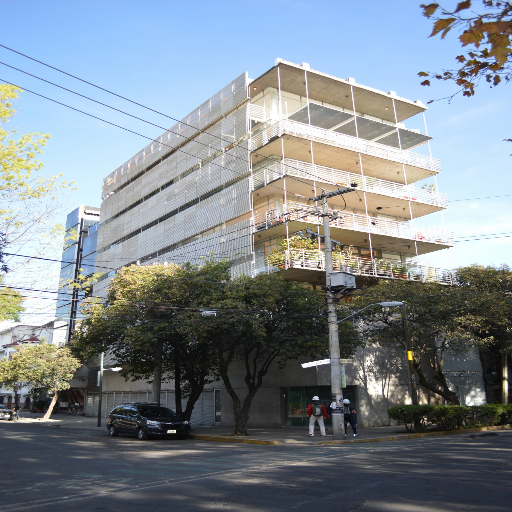

In [229]:
from PIL import Image

unnormalized_image = (image * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

In [230]:
print(segmentation_map.shape)
print(unnormalized_image.shape)
labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

(512, 512)
(512, 512, 3)
['No', 'Vegetative Growth']


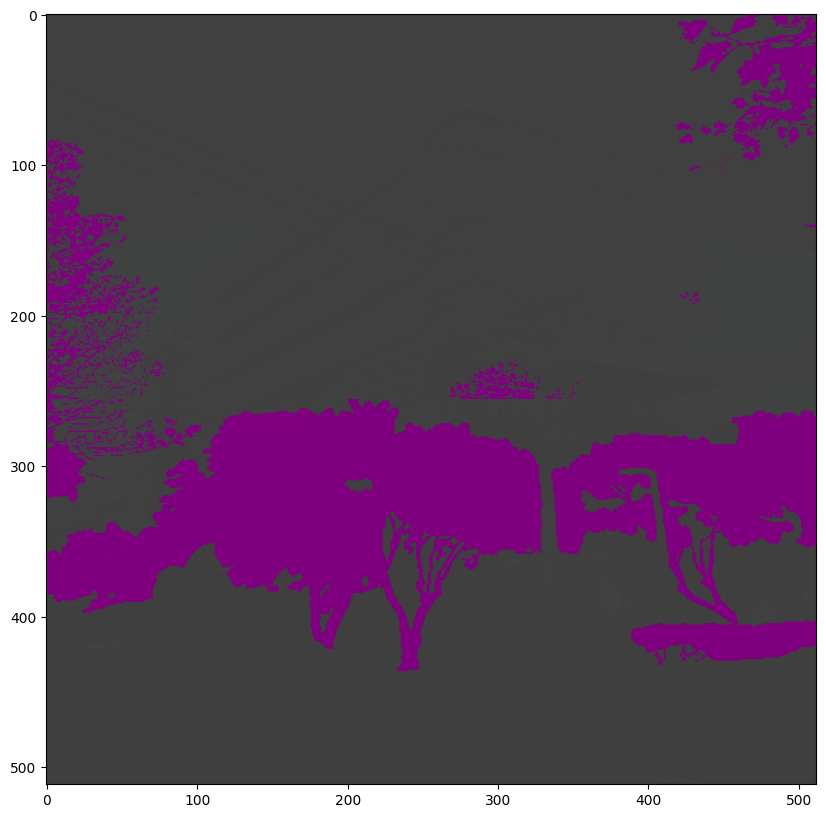

In [231]:
import numpy as np
import matplotlib.pyplot as plt

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.moveaxis(image, 0, -1) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

In [291]:

from torch.utils.data import DataLoader
from transformers import MaskFormerImageProcessor

# Create a preprocessor
# preprocessor = MaskFormerImageProcessor(ignore_index=0, reduce_labels=False, do_resize=False, do_rescale=False, do_normalize=False)

# Create a preprocessor
preprocessor = MaskFormerImageProcessor(
    size=(512, 512),
    ignore_index=0, 
    reduce_labels=False, 
    do_resize=False, 
    do_rescale=False, 
    do_normalize=False
)

def collate_fn(batch):
    ignore_index = 0 
    inputs = list(zip(*batch))
    images = inputs[0]  # Processed images
    segmentation_maps = inputs[1]  # Processed segmentation maps
    original_images = inputs[2]  # Original images
    original_segmentation_maps = inputs[3]  # Original segmentation maps
    
    # Process the batch
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )
    
    # Store the original images and segmentation maps
    batch["original_images"] = original_images
    batch["original_segmentation_maps"] = original_segmentation_maps
    
    return batch


from torch.utils.data.dataloader import default_collate

def custom_collate(batch):
    # Filter out None items
    batch = [item for item in batch if item is not None]
    if len(batch) == 0:
        return None  # Handle empty batch case as needed
    return default_collate(batch)

# Use this in your DataLoader
# train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=custom_collate)

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

In [292]:
# Fetch one batch from the DataLoader
batch = next(iter(test_dataloader))

# Since batch is likely a dictionary-like object, use keys to access data
if isinstance(batch, dict):
    for key, value in batch.items():
        if isinstance(value, torch.Tensor):
            print(f"Key: {key}, Tensor shape: {value.shape}")
            
        else:
            print(f"Key: {key}, Value: {value}")
else:
    print("Batch is not in the expected format.")


Batch is not in the expected format.


In [294]:
pixel_values = batch["pixel_values"][0]
pixel_values.shape

torch.Size([3, 512, 512])

In [295]:
# verify class labels
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['No', 'Vegetative Growth']


In [296]:
# verify mask labels
batch["mask_labels"][0].shape

torch.Size([2, 512, 512])

In [297]:
# def visualize_mask(labels, label_name):
#   print("Label:", label_name)
#   idx = labels.index(label_name)

#   visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
#   return Image.fromarray(visual_mask)

# visualize_mask(labels, "Vegetative Growth")

Define Model 

In [298]:
from transformers import MaskFormerForInstanceSegmentation

# Replace the head of the pre-trained model
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-ade",
                                                          id2label=id2label,
                                                          ignore_mismatched_sizes=True)

Some weights of MaskFormerForInstanceSegmentation were not initialized from the model checkpoint at facebook/maskformer-swin-base-ade and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([151, 256]) in the checkpoint and torch.Size([9, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([151]) in the checkpoint and torch.Size([9]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([151]) in the checkpoint and torch.Size([9]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [29]:
outputs = model(batch["pixel_values"],
                class_labels=batch["class_labels"],
                mask_labels=batch["mask_labels"])

In [30]:
outputs.loss

tensor([6.7815], grad_fn=<AddBackward0>)

In [31]:
import evaluate

metric = evaluate.load("mean_iou")

In [32]:
import torch
from tqdm.auto import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(100):
  print("Epoch:", epoch)
  model.train()
  for idx, batch in enumerate(tqdm(train_dataloader)):
      # Reset the parameter gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
      )

      # Backward propagation
      loss = outputs.loss
      loss.backward()

      batch_size = batch["pixel_values"].size(0)
      running_loss += loss.item()
      num_samples += batch_size

      if idx % 100 == 0:
        print("Loss:", running_loss/num_samples)

      # Optimization
      optimizer.step()

  model.eval()
  for idx, batch in enumerate(tqdm(test_dataloader)):
    if idx > 5:
      break

    pixel_values = batch["pixel_values"]
    
    # Forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values.to(device))

    # get original images
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)
  
  # NOTE this metric outputs a dict that also includes the mIoU per category as keys
  # so if you're interested, feel free to print them as well
  print("Mean IoU:", metric.compute(num_labels = len(id2label), ignore_index = 0)['mean_iou'])

Epoch: 0


  0%|          | 1/391 [00:03<23:40,  3.64s/it]

Loss: 1.510093331336975


 26%|██▌       | 101/391 [00:33<01:52,  2.58it/s]

Loss: 0.7245956497027142


 51%|█████▏    | 201/391 [01:12<01:13,  2.60it/s]

Loss: 0.6145924515466192


 77%|███████▋  | 301/391 [01:51<00:34,  2.62it/s]

Loss: 0.5870796662083891


  5%|▌         | 6/112 [00:55<16:24,  9.29s/it]
C:\Users\skoka3\.cache\huggingface\modules\evaluate_modules\metrics\evaluate-metric--mean_iou\08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9\mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
C:\Users\skoka3\.cache\huggingface\modules\evaluate_modules\metrics\evaluate-metric--mean_iou\08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9\mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Mean IoU: 0.24000731680197257
Epoch: 1


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.5626023493384068


 26%|██▌       | 101/391 [00:40<01:51,  2.61it/s]

Loss: 0.5417454411934425


 51%|█████▏    | 201/391 [01:20<01:13,  2.60it/s]

Loss: 0.5247225656828566


 77%|███████▋  | 301/391 [01:59<00:35,  2.50it/s]

Loss: 0.509350248284078


  5%|▌         | 6/112 [00:55<16:26,  9.31s/it]


Mean IoU: 0.24120326605432574
Epoch: 2


  0%|          | 1/391 [00:00<03:58,  1.63it/s]

Loss: 0.5032348085770509


 26%|██▌       | 101/391 [00:41<01:53,  2.55it/s]

Loss: 0.5003274969275648


 51%|█████▏    | 201/391 [01:22<01:16,  2.49it/s]

Loss: 0.499082271271174


 77%|███████▋  | 301/391 [02:02<00:36,  2.48it/s]

Loss: 0.49538880004612035


  5%|▌         | 6/112 [00:56<16:39,  9.43s/it]


Mean IoU: 0.2356184508640182
Epoch: 3


  0%|          | 1/391 [00:00<03:35,  1.81it/s]

Loss: 0.4903199833229159


 26%|██▌       | 101/391 [00:40<02:03,  2.34it/s]

Loss: 0.484224890749112


 51%|█████▏    | 201/391 [01:20<01:16,  2.50it/s]

Loss: 0.47889637453359546


 77%|███████▋  | 301/391 [02:00<00:36,  2.49it/s]

Loss: 0.47259283512628547


  5%|▌         | 6/112 [00:55<16:18,  9.23s/it]


Mean IoU: 0.24107438219879398
Epoch: 4


  0%|          | 1/391 [00:00<04:18,  1.51it/s]

Loss: 0.46800618420917384


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.46452737743476846


 51%|█████▏    | 201/391 [01:20<01:15,  2.52it/s]

Loss: 0.46113045050765233


 77%|███████▋  | 301/391 [02:00<00:36,  2.49it/s]

Loss: 0.45873133367371943


  5%|▌         | 6/112 [00:56<16:44,  9.48s/it]


Mean IoU: 0.24413279736576224
Epoch: 5


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.45330777946871026


 26%|██▌       | 101/391 [00:39<01:54,  2.54it/s]

Loss: 0.4492930807562813


 51%|█████▏    | 201/391 [01:19<01:16,  2.50it/s]

Loss: 0.44534158373445076


 77%|███████▋  | 301/391 [01:59<00:35,  2.54it/s]

Loss: 0.44233594007760363


  5%|▌         | 6/112 [00:55<16:19,  9.24s/it]


Mean IoU: 0.24760958759981297
Epoch: 6


  0%|          | 1/391 [00:00<03:16,  1.99it/s]

Loss: 0.4398816068877768


 26%|██▌       | 101/391 [00:40<01:57,  2.47it/s]

Loss: 0.4358076138363281


 51%|█████▏    | 201/391 [01:18<01:10,  2.70it/s]

Loss: 0.4332907638403952


 77%|███████▋  | 301/391 [01:57<00:34,  2.63it/s]

Loss: 0.4310333521633462


  5%|▌         | 6/112 [00:56<16:36,  9.40s/it]


Mean IoU: 0.23748024962986714
Epoch: 7


  0%|          | 1/391 [00:00<03:29,  1.86it/s]

Loss: 0.4287799644713216


 26%|██▌       | 101/391 [00:40<01:50,  2.62it/s]

Loss: 0.4269124730309659


 51%|█████▏    | 201/391 [01:19<01:15,  2.52it/s]

Loss: 0.42458700626857776


 77%|███████▋  | 301/391 [01:59<00:36,  2.49it/s]

Loss: 0.4222850995812715


  5%|▌         | 6/112 [00:54<16:09,  9.15s/it]


Mean IoU: 0.24282366157044746
Epoch: 8


  0%|          | 1/391 [00:00<04:31,  1.43it/s]

Loss: 0.4198218100386073


 26%|██▌       | 101/391 [00:40<01:55,  2.51it/s]

Loss: 0.4174368034427557


 51%|█████▏    | 201/391 [01:20<01:15,  2.53it/s]

Loss: 0.4157659582156978


 77%|███████▋  | 301/391 [01:59<00:35,  2.55it/s]

Loss: 0.41376226414326384


  5%|▌         | 6/112 [00:54<16:01,  9.07s/it]


Mean IoU: 0.24276893510056816
Epoch: 9


  0%|          | 1/391 [00:00<03:16,  1.99it/s]

Loss: 0.41235723462940027


 26%|██▌       | 101/391 [00:40<01:53,  2.56it/s]

Loss: 0.4116305317436422


 51%|█████▏    | 201/391 [01:19<01:16,  2.49it/s]

Loss: 0.409862716585618


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.40903981400565953


  5%|▌         | 6/112 [00:56<16:30,  9.35s/it]


Mean IoU: 0.18695901507391272
Epoch: 10


  0%|          | 1/391 [00:00<04:13,  1.54it/s]

Loss: 0.40750497165087224


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.4063023141898982


 51%|█████▏    | 201/391 [01:18<01:12,  2.63it/s]

Loss: 0.4043028885215463


 77%|███████▋  | 301/391 [01:57<00:35,  2.52it/s]

Loss: 0.40337796823451805


  5%|▌         | 6/112 [00:53<15:43,  8.90s/it]


Mean IoU: 0.23182603976735397
Epoch: 11


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.4019990137291995


 26%|██▌       | 101/391 [00:40<01:52,  2.58it/s]

Loss: 0.40039480918775505


 51%|█████▏    | 201/391 [01:19<01:12,  2.63it/s]

Loss: 0.3994273388477374


 77%|███████▋  | 301/391 [01:59<00:35,  2.56it/s]

Loss: 0.3986936502184141


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.24325970338004427
Epoch: 12


  0%|          | 1/391 [00:00<03:42,  1.75it/s]

Loss: 0.39755591058172085


 26%|██▌       | 101/391 [00:40<01:55,  2.52it/s]

Loss: 0.39683030503255023


 51%|█████▏    | 201/391 [01:19<01:16,  2.47it/s]

Loss: 0.3960246051658434


 77%|███████▋  | 301/391 [01:58<00:34,  2.59it/s]

Loss: 0.39394617282602495


  5%|▌         | 6/112 [00:53<15:41,  8.88s/it]


Mean IoU: 0.23174719659957607
Epoch: 13


  0%|          | 1/391 [00:00<03:47,  1.71it/s]

Loss: 0.3927064766888642


 26%|██▌       | 101/391 [00:40<01:55,  2.50it/s]

Loss: 0.3918357458463971


 51%|█████▏    | 201/391 [01:19<01:12,  2.63it/s]

Loss: 0.3908902095624772


 77%|███████▋  | 301/391 [01:58<00:36,  2.48it/s]

Loss: 0.38998063453379744


  5%|▌         | 6/112 [00:56<16:35,  9.40s/it]


Mean IoU: 0.17326723098133703
Epoch: 14


  0%|          | 1/391 [00:00<05:27,  1.19it/s]

Loss: 0.3887662876388866


 26%|██▌       | 101/391 [00:40<01:52,  2.57it/s]

Loss: 0.3875877698402301


 51%|█████▏    | 201/391 [01:19<01:15,  2.53it/s]

Loss: 0.38678092351979226


 77%|███████▋  | 301/391 [01:58<00:34,  2.61it/s]

Loss: 0.3864979750745289


  5%|▌         | 6/112 [00:51<15:12,  8.61s/it]


Mean IoU: 0.2399319490460375
Epoch: 15


  0%|          | 1/391 [00:00<03:54,  1.66it/s]

Loss: 0.3858240538974033


 26%|██▌       | 101/391 [00:40<01:57,  2.48it/s]

Loss: 0.3849508319756605


 51%|█████▏    | 201/391 [01:19<01:13,  2.59it/s]

Loss: 0.38394087265997


 77%|███████▋  | 301/391 [01:58<00:34,  2.63it/s]

Loss: 0.3838161720055694


  5%|▌         | 6/112 [00:57<16:49,  9.52s/it]


Mean IoU: 0.2210897742373986
Epoch: 16


  0%|          | 1/391 [00:00<04:10,  1.56it/s]

Loss: 0.3833307739020058


 26%|██▌       | 101/391 [00:39<01:55,  2.52it/s]

Loss: 0.3827098750299675


 51%|█████▏    | 201/391 [01:18<01:13,  2.58it/s]

Loss: 0.3818713061747196


 77%|███████▋  | 301/391 [01:57<00:35,  2.53it/s]

Loss: 0.380949966972093


  5%|▌         | 6/112 [00:52<15:28,  8.76s/it]


Mean IoU: 0.23908046779990597
Epoch: 17


  0%|          | 1/391 [00:00<04:18,  1.51it/s]

Loss: 0.3803388495083672


 26%|██▌       | 101/391 [00:40<01:52,  2.57it/s]

Loss: 0.379397184426952


 51%|█████▏    | 201/391 [01:19<01:16,  2.49it/s]

Loss: 0.37842203142046904


 77%|███████▋  | 301/391 [01:58<00:35,  2.57it/s]

Loss: 0.37785245999187195


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.23886685749439693
Epoch: 18


  0%|          | 1/391 [00:00<03:59,  1.63it/s]

Loss: 0.37837122353835084


 26%|██▌       | 101/391 [00:39<01:51,  2.60it/s]

Loss: 0.37789852413518316


 51%|█████▏    | 201/391 [01:18<01:12,  2.62it/s]

Loss: 0.37720418269439165


 77%|███████▋  | 301/391 [01:57<00:34,  2.62it/s]

Loss: 0.37681126366820555


  5%|▌         | 6/112 [00:54<16:04,  9.10s/it]


Mean IoU: 0.24833178054422284
Epoch: 19


  0%|          | 1/391 [00:00<03:43,  1.75it/s]

Loss: 0.3768140452184425


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.3760927848813494


 51%|█████▏    | 201/391 [01:20<01:15,  2.51it/s]

Loss: 0.3753042070699189


 77%|███████▋  | 301/391 [01:59<00:34,  2.64it/s]

Loss: 0.3749816245423512


  5%|▌         | 6/112 [00:53<15:53,  8.99s/it]


Mean IoU: 0.1962321193422633
Epoch: 20


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.37432794578470124


 26%|██▌       | 101/391 [00:40<01:54,  2.53it/s]

Loss: 0.3735040746387736


 51%|█████▏    | 201/391 [01:19<01:13,  2.58it/s]

Loss: 0.3730415188412607


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.373152259960766


  5%|▌         | 6/112 [00:52<15:33,  8.81s/it]


Mean IoU: 0.23815324282888842
Epoch: 21


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.3731273856120392


 26%|██▌       | 101/391 [00:39<01:54,  2.53it/s]

Loss: 0.3725317051797555


 51%|█████▏    | 201/391 [01:18<01:16,  2.49it/s]

Loss: 0.3720806451100073


 77%|███████▋  | 301/391 [01:58<00:36,  2.46it/s]

Loss: 0.37138795521895007


  5%|▌         | 6/112 [00:55<16:22,  9.27s/it]


Mean IoU: 0.23140294242037104
Epoch: 22


  0%|          | 1/391 [00:00<03:55,  1.66it/s]

Loss: 0.37084016603657266


 26%|██▌       | 101/391 [00:40<01:51,  2.59it/s]

Loss: 0.3701276366085141


 51%|█████▏    | 201/391 [01:19<01:14,  2.54it/s]

Loss: 0.3693866690694414


 77%|███████▋  | 301/391 [01:58<00:35,  2.57it/s]

Loss: 0.3688421050207126


  5%|▌         | 6/112 [00:54<16:09,  9.15s/it]


Mean IoU: 0.240964980026735
Epoch: 23


  0%|          | 1/391 [00:00<04:15,  1.53it/s]

Loss: 0.36826945074871414


 26%|██▌       | 101/391 [00:39<01:50,  2.62it/s]

Loss: 0.36809683438033697


 51%|█████▏    | 201/391 [01:19<01:17,  2.46it/s]

Loss: 0.3672265217188533


 77%|███████▋  | 301/391 [01:57<00:36,  2.49it/s]

Loss: 0.3666362431851699


  5%|▌         | 6/112 [00:55<16:28,  9.33s/it]


Mean IoU: 0.24988826627642455
Epoch: 24


  0%|          | 1/391 [00:00<04:08,  1.57it/s]

Loss: 0.36596280594540437


 26%|██▌       | 101/391 [00:40<01:51,  2.60it/s]

Loss: 0.3654940568329938


 51%|█████▏    | 201/391 [01:20<01:16,  2.49it/s]

Loss: 0.36509218853837616


 77%|███████▋  | 301/391 [01:59<00:36,  2.48it/s]

Loss: 0.36514667912338755


  5%|▌         | 6/112 [00:55<16:27,  9.32s/it]


Mean IoU: 0.23407748329351938
Epoch: 25


  0%|          | 1/391 [00:00<03:54,  1.67it/s]

Loss: 0.3646835556482239


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.36415132140914647


 51%|█████▏    | 201/391 [01:19<01:16,  2.49it/s]

Loss: 0.36388724746543666


 77%|███████▋  | 301/391 [01:58<00:35,  2.55it/s]

Loss: 0.3636597858167151


  5%|▌         | 6/112 [00:56<16:36,  9.40s/it]


Mean IoU: 0.23688135775204935
Epoch: 26


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.36348399647165375


 26%|██▌       | 101/391 [00:40<01:57,  2.46it/s]

Loss: 0.36333132678350966


 51%|█████▏    | 201/391 [01:19<01:11,  2.65it/s]

Loss: 0.3628941290642018


 77%|███████▋  | 301/391 [01:58<00:34,  2.59it/s]

Loss: 0.3623178170714892


  5%|▌         | 6/112 [00:53<15:39,  8.86s/it]


Mean IoU: 0.2446268742876058
Epoch: 27


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.3620265360068982


 26%|██▌       | 101/391 [00:39<01:53,  2.56it/s]

Loss: 0.3613561771387648


 51%|█████▏    | 201/391 [01:17<01:15,  2.52it/s]

Loss: 0.36137099438072495


 77%|███████▋  | 301/391 [01:56<00:34,  2.62it/s]

Loss: 0.36230597148770677


  5%|▌         | 6/112 [00:54<16:04,  9.10s/it]


Mean IoU: 0.244978357250461
Epoch: 28


  0%|          | 1/391 [00:00<04:06,  1.58it/s]

Loss: 0.362357148996831


 26%|██▌       | 101/391 [00:40<01:54,  2.53it/s]

Loss: 0.3623992570476395


 51%|█████▏    | 201/391 [01:20<01:17,  2.46it/s]

Loss: 0.3620065186407121


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.3616772418805623


  5%|▌         | 6/112 [00:53<15:51,  8.98s/it]


Mean IoU: 0.248357428933809
Epoch: 29


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.36142553562369045


 26%|██▌       | 101/391 [00:39<01:52,  2.58it/s]

Loss: 0.36133093001309563


 51%|█████▏    | 201/391 [01:19<01:16,  2.48it/s]

Loss: 0.3615797196962811


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.36141388533369695


  5%|▌         | 6/112 [00:55<16:16,  9.22s/it]


Mean IoU: 0.2486127940167418
Epoch: 30


  0%|          | 1/391 [00:00<03:29,  1.86it/s]

Loss: 0.3620706477359905


 26%|██▌       | 101/391 [00:40<01:55,  2.51it/s]

Loss: 0.3622190313268582


 51%|█████▏    | 201/391 [01:19<01:16,  2.48it/s]

Loss: 0.36182857628733134


 77%|███████▋  | 301/391 [01:59<00:35,  2.51it/s]

Loss: 0.3614808250030213


  5%|▌         | 6/112 [00:56<16:44,  9.48s/it]


Mean IoU: 0.2445662613628554
Epoch: 31


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.36139097569139716


 26%|██▌       | 101/391 [00:39<01:50,  2.62it/s]

Loss: 0.36110116373477835


 51%|█████▏    | 201/391 [01:17<01:13,  2.59it/s]

Loss: 0.36093121918004184


 77%|███████▋  | 301/391 [01:56<00:34,  2.60it/s]

Loss: 0.3607050186514793


  5%|▌         | 6/112 [00:55<16:19,  9.24s/it]


Mean IoU: 0.2531014674684636
Epoch: 32


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.36053532464673116


 26%|██▌       | 101/391 [00:40<01:55,  2.52it/s]

Loss: 0.3603129929537363


 51%|█████▏    | 201/391 [01:19<01:14,  2.57it/s]

Loss: 0.35994884700691


 77%|███████▋  | 301/391 [01:59<00:36,  2.50it/s]

Loss: 0.359641559851807


  5%|▌         | 6/112 [00:55<16:13,  9.18s/it]


Mean IoU: 0.19518368913967987
Epoch: 33


  0%|          | 1/391 [00:00<03:47,  1.72it/s]

Loss: 0.35937085212201114


 26%|██▌       | 101/391 [00:39<01:52,  2.57it/s]

Loss: 0.3590338730611513


 51%|█████▏    | 201/391 [01:19<01:11,  2.66it/s]

Loss: 0.35870847670707945


 77%|███████▋  | 301/391 [01:57<00:35,  2.56it/s]

Loss: 0.3582503986686679


  5%|▌         | 6/112 [00:55<16:28,  9.32s/it]


Mean IoU: 0.15428759442298975
Epoch: 34


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.35796250305381955


 26%|██▌       | 101/391 [00:40<01:53,  2.55it/s]

Loss: 0.35766678335859164


 51%|█████▏    | 201/391 [01:19<01:14,  2.54it/s]

Loss: 0.3572557764227228


 77%|███████▋  | 301/391 [01:58<00:34,  2.58it/s]

Loss: 0.3568587220963413


  5%|▌         | 6/112 [00:55<16:13,  9.18s/it]


Mean IoU: 0.2127286198617465
Epoch: 35


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.35656393623228855


 26%|██▌       | 101/391 [00:40<01:52,  2.57it/s]

Loss: 0.35622289210503083


 51%|█████▏    | 201/391 [01:19<01:12,  2.62it/s]

Loss: 0.3558620038347344


 77%|███████▋  | 301/391 [01:58<00:34,  2.63it/s]

Loss: 0.3554448821048118


  5%|▌         | 6/112 [00:54<16:10,  9.16s/it]


Mean IoU: 0.19029338553231662
Epoch: 36


  0%|          | 1/391 [00:00<03:59,  1.63it/s]

Loss: 0.3549898521733334


 26%|██▌       | 101/391 [00:40<01:51,  2.59it/s]

Loss: 0.3545627490008825


 51%|█████▏    | 201/391 [01:19<01:16,  2.50it/s]

Loss: 0.3541724481584995


 77%|███████▋  | 301/391 [01:58<00:36,  2.49it/s]

Loss: 0.3539694952445232


  5%|▌         | 6/112 [00:54<16:06,  9.12s/it]


Mean IoU: 0.24756404355345005
Epoch: 37


  0%|          | 1/391 [00:00<03:22,  1.93it/s]

Loss: 0.353614586815565


 26%|██▌       | 101/391 [00:40<01:53,  2.56it/s]

Loss: 0.35319317401498546


 51%|█████▏    | 201/391 [01:19<01:14,  2.55it/s]

Loss: 0.3532028952810938


 77%|███████▋  | 301/391 [01:58<00:33,  2.67it/s]

Loss: 0.3531687351770196


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.2428563200381864
Epoch: 38


  0%|          | 1/391 [00:00<04:03,  1.60it/s]

Loss: 0.3532381846719716


 26%|██▌       | 101/391 [00:40<01:56,  2.49it/s]

Loss: 0.3531014459625781


 51%|█████▏    | 201/391 [01:19<01:14,  2.55it/s]

Loss: 0.3529098284392396


 77%|███████▋  | 301/391 [01:58<00:34,  2.57it/s]

Loss: 0.3528323667447072


  5%|▌         | 6/112 [00:55<16:11,  9.17s/it]


Mean IoU: 0.24829677296978517
Epoch: 39


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.35265464501089006


 26%|██▌       | 101/391 [00:39<01:54,  2.52it/s]

Loss: 0.35237117639491


 51%|█████▏    | 201/391 [01:19<01:15,  2.53it/s]

Loss: 0.35209478750752593


 77%|███████▋  | 301/391 [01:57<00:34,  2.63it/s]

Loss: 0.35186004878048727


  5%|▌         | 6/112 [00:55<16:25,  9.29s/it]


Mean IoU: 0.23995912396973315
Epoch: 40


  0%|          | 1/391 [00:00<03:59,  1.63it/s]

Loss: 0.3517543003668063


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.35157606005952635


 51%|█████▏    | 201/391 [01:19<01:14,  2.56it/s]

Loss: 0.3512421472790728


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.3509842609986312


  5%|▌         | 6/112 [00:54<16:06,  9.12s/it]


Mean IoU: 0.23283812680067187
Epoch: 41


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.3507136821023239


 26%|██▌       | 101/391 [00:40<01:53,  2.54it/s]

Loss: 0.3504860443175079


 51%|█████▏    | 201/391 [01:19<01:13,  2.60it/s]

Loss: 0.3501536828477694


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.3498333080637171


  5%|▌         | 6/112 [00:56<16:36,  9.40s/it]


Mean IoU: 0.17571216614607804
Epoch: 42


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.3495896222392644


 26%|██▌       | 101/391 [00:39<01:58,  2.45it/s]

Loss: 0.3491627338844526


 51%|█████▏    | 201/391 [01:19<01:13,  2.59it/s]

Loss: 0.34889538268286563


 77%|███████▋  | 301/391 [01:58<00:33,  2.67it/s]

Loss: 0.3489850558033023


  5%|▌         | 6/112 [00:55<16:14,  9.20s/it]


Mean IoU: 0.15833820538379123
Epoch: 43


  0%|          | 1/391 [00:00<03:46,  1.72it/s]

Loss: 0.3489348452936061


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.34884401065996384


 51%|█████▏    | 201/391 [01:19<01:14,  2.54it/s]

Loss: 0.3488536024245232


 77%|███████▋  | 301/391 [01:58<00:34,  2.59it/s]

Loss: 0.34863078656805657


  5%|▌         | 6/112 [00:54<16:04,  9.09s/it]


Mean IoU: 0.22230488496717785
Epoch: 44


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.34848155466711384


 26%|██▌       | 101/391 [00:40<01:55,  2.52it/s]

Loss: 0.3481057503262018


 51%|█████▏    | 201/391 [01:20<01:16,  2.49it/s]

Loss: 0.3478301092332159


 77%|███████▋  | 301/391 [01:59<00:35,  2.57it/s]

Loss: 0.34737239632291583


  5%|▌         | 6/112 [00:55<16:17,  9.22s/it]


Mean IoU: 0.18537152164101328
Epoch: 45


  0%|          | 1/391 [00:00<03:46,  1.72it/s]

Loss: 0.34726632843432376


 26%|██▌       | 101/391 [00:39<01:53,  2.55it/s]

Loss: 0.34709379154706504


 51%|█████▏    | 201/391 [01:19<01:15,  2.50it/s]

Loss: 0.3468436782021087


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.34652119682335525


  5%|▌         | 6/112 [00:53<15:42,  8.90s/it]


Mean IoU: 0.24076466097334517
Epoch: 46


  0%|          | 1/391 [00:00<03:59,  1.63it/s]

Loss: 0.3462840455912549


 26%|██▌       | 101/391 [00:40<01:49,  2.65it/s]

Loss: 0.34596409998545163


 51%|█████▏    | 201/391 [01:19<01:15,  2.53it/s]

Loss: 0.34573374265640916


 77%|███████▋  | 301/391 [01:58<00:37,  2.43it/s]

Loss: 0.34555230063449466


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.22104586169493887
Epoch: 47


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.3452033842409074


 26%|██▌       | 101/391 [00:40<01:54,  2.53it/s]

Loss: 0.34496596906402105


 51%|█████▏    | 201/391 [01:19<01:14,  2.55it/s]

Loss: 0.34482960447997685


 77%|███████▋  | 301/391 [01:58<00:35,  2.56it/s]

Loss: 0.3446429763012718


  5%|▌         | 6/112 [00:53<15:36,  8.84s/it]


Mean IoU: 0.2412246451275235
Epoch: 48


  0%|          | 1/391 [00:00<04:17,  1.51it/s]

Loss: 0.3443705612582976


 26%|██▌       | 101/391 [00:40<01:57,  2.46it/s]

Loss: 0.3440631622231589


 51%|█████▏    | 201/391 [01:19<01:16,  2.50it/s]

Loss: 0.34373778027326546


 77%|███████▋  | 301/391 [01:59<00:34,  2.57it/s]

Loss: 0.343581281685117


  5%|▌         | 6/112 [00:56<16:43,  9.47s/it]


Mean IoU: 0.19323216867843399
Epoch: 49


  0%|          | 1/391 [00:00<03:23,  1.92it/s]

Loss: 0.3432904466101025


 26%|██▌       | 101/391 [00:39<01:56,  2.49it/s]

Loss: 0.34292793182500464


 51%|█████▏    | 201/391 [01:19<01:16,  2.49it/s]

Loss: 0.3427089428796129


 77%|███████▋  | 301/391 [01:58<00:34,  2.59it/s]

Loss: 0.3423806425195976


  5%|▌         | 6/112 [00:51<15:10,  8.59s/it]


Mean IoU: 0.23273756641548474
Epoch: 50


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.34225491853780987


 26%|██▌       | 101/391 [00:40<01:54,  2.54it/s]

Loss: 0.3422187553790913


 51%|█████▏    | 201/391 [01:19<01:15,  2.51it/s]

Loss: 0.3422300253103709


 77%|███████▋  | 301/391 [01:58<00:36,  2.48it/s]

Loss: 0.34212316078292504


  5%|▌         | 6/112 [00:57<16:48,  9.51s/it]


Mean IoU: 0.21657883000228834
Epoch: 51


  0%|          | 1/391 [00:00<04:34,  1.42it/s]

Loss: 0.34209567536390245


 26%|██▌       | 101/391 [00:40<01:58,  2.45it/s]

Loss: 0.34190757986504416


 51%|█████▏    | 201/391 [01:20<01:15,  2.52it/s]

Loss: 0.34166165437256574


 77%|███████▋  | 301/391 [01:59<00:34,  2.61it/s]

Loss: 0.34142757506129007


  5%|▌         | 6/112 [00:54<16:01,  9.07s/it]


Mean IoU: 0.19860273852500074
Epoch: 52


  0%|          | 1/391 [00:00<04:00,  1.62it/s]

Loss: 0.3414609022360202


 26%|██▌       | 101/391 [00:39<01:50,  2.63it/s]

Loss: 0.3413625709956902


 51%|█████▏    | 201/391 [01:18<01:14,  2.56it/s]

Loss: 0.3410529558949297


 77%|███████▋  | 301/391 [01:58<00:34,  2.61it/s]

Loss: 0.34096064463154696


  5%|▌         | 6/112 [00:55<16:28,  9.32s/it]


Mean IoU: 0.17937206027634872
Epoch: 53


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.34075940358824597


 26%|██▌       | 101/391 [00:40<01:55,  2.51it/s]

Loss: 0.34050336405143816


 51%|█████▏    | 201/391 [01:19<01:12,  2.63it/s]

Loss: 0.3402290921442405


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.340070503470557


  5%|▌         | 6/112 [00:55<16:16,  9.21s/it]


Mean IoU: 0.23084363913253889
Epoch: 54


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.3399936286639047


 26%|██▌       | 101/391 [00:40<01:53,  2.55it/s]

Loss: 0.3398089534147605


 51%|█████▏    | 201/391 [01:20<01:15,  2.53it/s]

Loss: 0.33977454069367413


 77%|███████▋  | 301/391 [01:59<00:35,  2.54it/s]

Loss: 0.3395579400409936


  5%|▌         | 6/112 [00:55<16:20,  9.25s/it]


Mean IoU: 0.22516053081455123
Epoch: 55


  0%|          | 1/391 [00:00<03:35,  1.81it/s]

Loss: 0.33935941453089635


 26%|██▌       | 101/391 [00:40<01:53,  2.55it/s]

Loss: 0.3390606081844794


 51%|█████▏    | 201/391 [01:19<01:12,  2.62it/s]

Loss: 0.33889481520880416


 77%|███████▋  | 301/391 [01:58<00:33,  2.66it/s]

Loss: 0.33872606062744504


  5%|▌         | 6/112 [00:55<16:20,  9.25s/it]


Mean IoU: 0.24937163946888916
Epoch: 56


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.3385262221270456


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.3383123583040565


 51%|█████▏    | 201/391 [01:19<01:14,  2.56it/s]

Loss: 0.3379461761665928


 77%|███████▋  | 301/391 [01:59<00:37,  2.43it/s]

Loss: 0.3378360038735659


  5%|▌         | 6/112 [00:55<16:26,  9.31s/it]


Mean IoU: 0.24225625568228729
Epoch: 57


  0%|          | 1/391 [00:00<04:17,  1.51it/s]

Loss: 0.33772635948255075


 26%|██▌       | 101/391 [00:40<01:53,  2.56it/s]

Loss: 0.33748351125368087


 51%|█████▏    | 201/391 [01:19<01:12,  2.60it/s]

Loss: 0.3372743906002997


 77%|███████▋  | 301/391 [01:58<00:34,  2.58it/s]

Loss: 0.3370408895833684


  5%|▌         | 6/112 [00:54<16:04,  9.10s/it]


Mean IoU: 0.24334421143264257
Epoch: 58


  0%|          | 1/391 [00:00<03:36,  1.80it/s]

Loss: 0.3369471997630725


 26%|██▌       | 101/391 [00:39<01:58,  2.46it/s]

Loss: 0.3366247162051063


 51%|█████▏    | 201/391 [01:18<01:13,  2.57it/s]

Loss: 0.33642518364115775


 77%|███████▋  | 301/391 [01:57<00:35,  2.55it/s]

Loss: 0.3362826864668402


  5%|▌         | 6/112 [00:57<16:55,  9.58s/it]


Mean IoU: 0.2400757227331546
Epoch: 59


  0%|          | 1/391 [00:00<03:47,  1.72it/s]

Loss: 0.3362652025011533


 26%|██▌       | 101/391 [00:40<01:57,  2.47it/s]

Loss: 0.3361165685428851


 51%|█████▏    | 201/391 [01:19<01:12,  2.63it/s]

Loss: 0.3360034951494729


 77%|███████▋  | 301/391 [01:58<00:36,  2.48it/s]

Loss: 0.33584093557496164


  5%|▌         | 6/112 [00:54<16:08,  9.14s/it]


Mean IoU: 0.2294099812352824
Epoch: 60


  0%|          | 1/391 [00:00<04:02,  1.61it/s]

Loss: 0.33570842093922937


 26%|██▌       | 101/391 [00:39<01:51,  2.60it/s]

Loss: 0.3354396331596171


 51%|█████▏    | 201/391 [01:18<01:15,  2.53it/s]

Loss: 0.33532220802763973


 77%|███████▋  | 301/391 [01:57<00:36,  2.46it/s]

Loss: 0.3352532792007601


  5%|▌         | 6/112 [00:56<16:44,  9.48s/it]


Mean IoU: 0.2344041458616089
Epoch: 61


  0%|          | 1/391 [00:00<03:46,  1.72it/s]

Loss: 0.33519012912950596


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.3350798966849964


 51%|█████▏    | 201/391 [01:19<01:13,  2.57it/s]

Loss: 0.33490269014910923


 77%|███████▋  | 301/391 [01:58<00:34,  2.57it/s]

Loss: 0.33473445722234346


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.2518286356786658
Epoch: 62


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.3344795543158251


 26%|██▌       | 101/391 [00:39<01:49,  2.64it/s]

Loss: 0.33421308647101144


 51%|█████▏    | 201/391 [01:18<01:13,  2.58it/s]

Loss: 0.3341486949748486


 77%|███████▋  | 301/391 [01:57<00:33,  2.65it/s]

Loss: 0.3343772997124011


  5%|▌         | 6/112 [00:55<16:29,  9.33s/it]


Mean IoU: 0.21762256228449037
Epoch: 63


  0%|          | 1/391 [00:00<03:34,  1.81it/s]

Loss: 0.33451766089114404


 26%|██▌       | 101/391 [00:40<01:51,  2.60it/s]

Loss: 0.3346250443395507


 51%|█████▏    | 201/391 [01:19<01:14,  2.54it/s]

Loss: 0.3345383962699129


 77%|███████▋  | 301/391 [01:59<00:35,  2.50it/s]

Loss: 0.3343417312344204


  5%|▌         | 6/112 [00:54<16:06,  9.12s/it]


Mean IoU: 0.25347852407566795
Epoch: 64


  0%|          | 1/391 [00:00<03:35,  1.81it/s]

Loss: 0.3341182342606348


 26%|██▌       | 101/391 [00:39<01:52,  2.57it/s]

Loss: 0.33390437926693045


 51%|█████▏    | 201/391 [01:18<01:14,  2.55it/s]

Loss: 0.33384818613854106


 77%|███████▋  | 301/391 [01:58<00:35,  2.50it/s]

Loss: 0.33364340384791424


  5%|▌         | 6/112 [00:57<16:52,  9.55s/it]


Mean IoU: 0.25419317554538584
Epoch: 65


  0%|          | 1/391 [00:00<03:59,  1.63it/s]

Loss: 0.333518460257299


 26%|██▌       | 101/391 [00:40<01:56,  2.49it/s]

Loss: 0.3334160990027416


 51%|█████▏    | 201/391 [01:19<01:13,  2.60it/s]

Loss: 0.3331744103393035


 77%|███████▋  | 301/391 [01:59<00:36,  2.49it/s]

Loss: 0.3330070361845441


  5%|▌         | 6/112 [00:55<16:21,  9.26s/it]


Mean IoU: 0.24999981574009716
Epoch: 66


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.33279402394995444


 26%|██▌       | 101/391 [00:39<01:52,  2.58it/s]

Loss: 0.33260853480059194


 51%|█████▏    | 201/391 [01:18<01:17,  2.46it/s]

Loss: 0.33242230460245537


 77%|███████▋  | 301/391 [01:57<00:33,  2.65it/s]

Loss: 0.3322612140099383


  5%|▌         | 6/112 [00:55<16:22,  9.27s/it]


Mean IoU: 0.24960637309719985
Epoch: 67


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.3321220343525825


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.33191175511994614


 51%|█████▏    | 201/391 [01:19<01:13,  2.59it/s]

Loss: 0.33181575465881347


 77%|███████▋  | 301/391 [01:58<00:35,  2.50it/s]

Loss: 0.3316875343287686


  5%|▌         | 6/112 [00:54<16:07,  9.13s/it]


Mean IoU: 0.24875319173585372
Epoch: 68


  0%|          | 1/391 [00:00<03:16,  1.98it/s]

Loss: 0.33150083216418536


 26%|██▌       | 101/391 [00:39<01:52,  2.57it/s]

Loss: 0.3313614963338367


 51%|█████▏    | 201/391 [01:18<01:11,  2.66it/s]

Loss: 0.3312702593905888


 77%|███████▋  | 301/391 [01:57<00:34,  2.58it/s]

Loss: 0.3310920705925566


  5%|▌         | 6/112 [00:56<16:30,  9.34s/it]


Mean IoU: 0.23889993717581376
Epoch: 69


  0%|          | 1/391 [00:00<03:34,  1.81it/s]

Loss: 0.331031817582652


 26%|██▌       | 101/391 [00:39<01:51,  2.59it/s]

Loss: 0.33083170408309415


 51%|█████▏    | 201/391 [01:19<01:14,  2.54it/s]

Loss: 0.3306537419894054


 77%|███████▋  | 301/391 [01:58<00:35,  2.57it/s]

Loss: 0.3305407588553814


  5%|▌         | 6/112 [00:54<16:02,  9.08s/it]


Mean IoU: 0.254277066420577
Epoch: 70


  0%|          | 1/391 [00:00<03:47,  1.72it/s]

Loss: 0.3304302300686214


 26%|██▌       | 101/391 [00:40<01:54,  2.53it/s]

Loss: 0.330346741954932


 51%|█████▏    | 201/391 [01:18<01:13,  2.60it/s]

Loss: 0.3301807241937239


 77%|███████▋  | 301/391 [01:57<00:36,  2.45it/s]

Loss: 0.3304081255553091


  5%|▌         | 6/112 [00:54<16:07,  9.13s/it]


Mean IoU: 0.24878638454733637
Epoch: 71


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.33036670525502


 26%|██▌       | 101/391 [00:40<01:57,  2.48it/s]

Loss: 0.33024646264594376


 51%|█████▏    | 201/391 [01:19<01:14,  2.55it/s]

Loss: 0.3304000334184794


 77%|███████▋  | 301/391 [01:59<00:34,  2.58it/s]

Loss: 0.33045646370713544


  5%|▌         | 6/112 [00:53<15:48,  8.95s/it]


Mean IoU: 0.248954443901273
Epoch: 72


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.3304274344547163


 26%|██▌       | 101/391 [00:39<01:56,  2.49it/s]

Loss: 0.33044005221597694


 51%|█████▏    | 201/391 [01:18<01:10,  2.69it/s]

Loss: 0.330334825481233


 77%|███████▋  | 301/391 [01:57<00:35,  2.52it/s]

Loss: 0.3302930368967493


  5%|▌         | 6/112 [00:54<15:58,  9.04s/it]


Mean IoU: 0.24998039898879046
Epoch: 73


  0%|          | 1/391 [00:00<04:17,  1.52it/s]

Loss: 0.3301928915077242


 26%|██▌       | 101/391 [00:40<01:52,  2.58it/s]

Loss: 0.33007704795195736


 51%|█████▏    | 201/391 [01:19<01:14,  2.53it/s]

Loss: 0.32998841313503396


 77%|███████▋  | 301/391 [01:58<00:35,  2.51it/s]

Loss: 0.3298660500091549


  5%|▌         | 6/112 [00:53<15:53,  9.00s/it]


Mean IoU: 0.19299095301452202
Epoch: 74


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.3297922430586225


 26%|██▌       | 101/391 [00:39<01:50,  2.63it/s]

Loss: 0.3296792160097522


 51%|█████▏    | 201/391 [01:18<01:12,  2.62it/s]

Loss: 0.3296619770554076


 77%|███████▋  | 301/391 [01:57<00:35,  2.51it/s]

Loss: 0.3297651116386131


  5%|▌         | 6/112 [00:55<16:13,  9.19s/it]


Mean IoU: 0.25272840557375703
Epoch: 75


  0%|          | 1/391 [00:00<03:34,  1.81it/s]

Loss: 0.3296293179145681


 26%|██▌       | 101/391 [00:39<01:52,  2.59it/s]

Loss: 0.3294606682302966


 51%|█████▏    | 201/391 [01:18<01:14,  2.57it/s]

Loss: 0.32933655205765133


 77%|███████▋  | 301/391 [01:57<00:34,  2.64it/s]

Loss: 0.32913390994368086


  5%|▌         | 6/112 [00:53<15:46,  8.92s/it]


Mean IoU: 0.22628809767439956
Epoch: 76


  0%|          | 1/391 [00:00<03:34,  1.82it/s]

Loss: 0.32900326891453785


 26%|██▌       | 101/391 [00:39<01:50,  2.62it/s]

Loss: 0.32894312063541975


 51%|█████▏    | 201/391 [01:18<01:10,  2.69it/s]

Loss: 0.32885859307824644


 77%|███████▋  | 301/391 [01:56<00:33,  2.65it/s]

Loss: 0.32864443572341656


  5%|▌         | 6/112 [00:55<16:13,  9.19s/it]


Mean IoU: 0.24250250664167727
Epoch: 77


  0%|          | 1/391 [00:00<03:42,  1.75it/s]

Loss: 0.3284112621397629


 26%|██▌       | 101/391 [00:39<01:54,  2.54it/s]

Loss: 0.3282919647412262


 51%|█████▏    | 201/391 [01:18<01:13,  2.59it/s]

Loss: 0.32822294330821883


 77%|███████▋  | 301/391 [01:57<00:33,  2.67it/s]

Loss: 0.3280418932567941


  5%|▌         | 6/112 [00:54<16:01,  9.07s/it]


Mean IoU: 0.2377185801433564
Epoch: 78


  0%|          | 1/391 [00:00<03:52,  1.67it/s]

Loss: 0.32787073502103503


 26%|██▌       | 101/391 [00:39<01:54,  2.53it/s]

Loss: 0.3277175741470699


 51%|█████▏    | 201/391 [01:18<01:12,  2.64it/s]

Loss: 0.32758195472276214


 77%|███████▋  | 301/391 [01:57<00:34,  2.62it/s]

Loss: 0.3274250735774517


  5%|▌         | 6/112 [00:53<15:51,  8.98s/it]


Mean IoU: 0.24027096620406585
Epoch: 79


  0%|          | 1/391 [00:00<04:17,  1.51it/s]

Loss: 0.32725999522541177


 26%|██▌       | 101/391 [00:40<01:59,  2.43it/s]

Loss: 0.3270993116809396


 51%|█████▏    | 201/391 [01:19<01:12,  2.61it/s]

Loss: 0.32693876277936346


 77%|███████▋  | 301/391 [01:58<00:35,  2.50it/s]

Loss: 0.3269663947838042


  5%|▌         | 6/112 [00:55<16:24,  9.29s/it]


Mean IoU: 0.24730757105851234
Epoch: 80


  0%|          | 1/391 [00:00<04:11,  1.55it/s]

Loss: 0.32687041499326225


 26%|██▌       | 101/391 [00:40<01:57,  2.46it/s]

Loss: 0.32665561995539105


 51%|█████▏    | 201/391 [01:19<01:13,  2.57it/s]

Loss: 0.32651694509927354


 77%|███████▋  | 301/391 [01:58<00:33,  2.69it/s]

Loss: 0.3263226619282489


  5%|▌         | 6/112 [00:53<15:48,  8.95s/it]


Mean IoU: 0.24165924180106405
Epoch: 81


  0%|          | 1/391 [00:00<03:28,  1.87it/s]

Loss: 0.3262695280904605


 26%|██▌       | 101/391 [00:39<01:55,  2.52it/s]

Loss: 0.3260963920666071


 51%|█████▏    | 201/391 [01:18<01:12,  2.63it/s]

Loss: 0.3259520259497107


 77%|███████▋  | 301/391 [01:58<00:36,  2.46it/s]

Loss: 0.32579008436292933


  5%|▌         | 6/112 [00:56<16:44,  9.47s/it]


Mean IoU: 0.2431022866356041
Epoch: 82


  0%|          | 1/391 [00:00<03:46,  1.72it/s]

Loss: 0.32565730383185537


 26%|██▌       | 101/391 [00:39<01:56,  2.49it/s]

Loss: 0.3255089214668421


 51%|█████▏    | 201/391 [01:19<01:13,  2.59it/s]

Loss: 0.3253114944947935


 77%|███████▋  | 301/391 [01:58<00:35,  2.53it/s]

Loss: 0.3251747974035361


  5%|▌         | 6/112 [00:52<15:36,  8.83s/it]


Mean IoU: 0.2438099842088455
Epoch: 83


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.32502506941538223


 26%|██▌       | 101/391 [00:39<01:54,  2.54it/s]

Loss: 0.3249738889874191


 51%|█████▏    | 201/391 [01:19<01:13,  2.58it/s]

Loss: 0.32487486056411796


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.3247450003797097


  5%|▌         | 6/112 [00:56<16:38,  9.42s/it]


Mean IoU: 0.23445318212389238
Epoch: 84


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.3245878519476467


 26%|██▌       | 101/391 [00:39<01:56,  2.48it/s]

Loss: 0.32443318679416544


 51%|█████▏    | 201/391 [01:18<01:12,  2.62it/s]

Loss: 0.32428350177906223


 77%|███████▋  | 301/391 [01:57<00:34,  2.57it/s]

Loss: 0.32421222192924126


  5%|▌         | 6/112 [00:53<15:36,  8.83s/it]


Mean IoU: 0.22170701058418116
Epoch: 85


  0%|          | 1/391 [00:00<04:17,  1.51it/s]

Loss: 0.3241638244898179


 26%|██▌       | 101/391 [00:39<01:49,  2.64it/s]

Loss: 0.323968874460976


 51%|█████▏    | 201/391 [01:18<01:11,  2.66it/s]

Loss: 0.3237469833232137


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.3236324248599892


  5%|▌         | 6/112 [00:55<16:23,  9.28s/it]


Mean IoU: 0.250156278607259
Epoch: 86


  0%|          | 1/391 [00:00<03:16,  1.99it/s]

Loss: 0.3234709701223184


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.32329527077122294


 51%|█████▏    | 201/391 [01:19<01:15,  2.51it/s]

Loss: 0.3231226815037471


 77%|███████▋  | 301/391 [01:58<00:35,  2.51it/s]

Loss: 0.32295826475459105


  5%|▌         | 6/112 [00:53<15:44,  8.91s/it]


Mean IoU: 0.24126463635960402
Epoch: 87


  0%|          | 1/391 [00:00<03:25,  1.89it/s]

Loss: 0.3228638497624147


 26%|██▌       | 101/391 [00:39<01:55,  2.51it/s]

Loss: 0.32278731436912456


 51%|█████▏    | 201/391 [01:19<01:18,  2.41it/s]

Loss: 0.32262899706160464


 77%|███████▋  | 301/391 [01:58<00:34,  2.61it/s]

Loss: 0.3226127688370601


  5%|▌         | 6/112 [00:54<16:02,  9.08s/it]


Mean IoU: 0.24843290712842087
Epoch: 88


  0%|          | 1/391 [00:00<03:52,  1.67it/s]

Loss: 0.322582383070596


 26%|██▌       | 101/391 [00:39<01:56,  2.50it/s]

Loss: 0.3225397273172341


 51%|█████▏    | 201/391 [01:18<01:11,  2.65it/s]

Loss: 0.32244592413152906


 77%|███████▋  | 301/391 [01:57<00:35,  2.56it/s]

Loss: 0.32234071152648697


  5%|▌         | 6/112 [00:53<15:50,  8.97s/it]


Mean IoU: 0.14874126171110696
Epoch: 89


  0%|          | 1/391 [00:00<04:11,  1.55it/s]

Loss: 0.3222396724693472


 26%|██▌       | 101/391 [00:39<01:51,  2.60it/s]

Loss: 0.3221242770089776


 51%|█████▏    | 201/391 [01:19<01:13,  2.60it/s]

Loss: 0.32199529865792553


 77%|███████▋  | 301/391 [01:58<00:36,  2.47it/s]

Loss: 0.3218612945552496


  5%|▌         | 6/112 [00:57<17:00,  9.62s/it]


Mean IoU: 0.23655194480412897
Epoch: 90


  0%|          | 1/391 [00:00<04:29,  1.45it/s]

Loss: 0.32172566648856227


 26%|██▌       | 101/391 [00:40<01:55,  2.51it/s]

Loss: 0.321590047248476


 51%|█████▏    | 201/391 [01:18<01:14,  2.56it/s]

Loss: 0.32143892729192813


 77%|███████▋  | 301/391 [01:58<00:34,  2.59it/s]

Loss: 0.3212858792196411


  5%|▌         | 6/112 [00:54<16:04,  9.10s/it]


Mean IoU: 0.2187227512686411
Epoch: 91


  0%|          | 1/391 [00:00<04:17,  1.52it/s]

Loss: 0.3211618492239466


 26%|██▌       | 101/391 [00:39<01:52,  2.57it/s]

Loss: 0.3210360579424595


 51%|█████▏    | 201/391 [01:18<01:15,  2.53it/s]

Loss: 0.3208396433347077


 77%|███████▋  | 301/391 [01:57<00:35,  2.56it/s]

Loss: 0.3207660145406599


  5%|▌         | 6/112 [00:55<16:24,  9.29s/it]


Mean IoU: 0.22384132664038794
Epoch: 92


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.3207225062151019


 26%|██▌       | 101/391 [00:40<01:53,  2.56it/s]

Loss: 0.3207064904008441


 51%|█████▏    | 201/391 [01:19<01:14,  2.56it/s]

Loss: 0.32064405113594163


 77%|███████▋  | 301/391 [01:58<00:35,  2.57it/s]

Loss: 0.3205189323031453


  5%|▌         | 6/112 [00:54<16:00,  9.06s/it]


Mean IoU: 0.2465418963623385
Epoch: 93


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.3203600044577893


 26%|██▌       | 101/391 [00:38<01:52,  2.59it/s]

Loss: 0.3202111325327866


 51%|█████▏    | 201/391 [01:17<01:13,  2.59it/s]

Loss: 0.3200988724890731


 77%|███████▋  | 301/391 [01:56<00:35,  2.51it/s]

Loss: 0.319958712948828


  5%|▌         | 6/112 [00:56<16:33,  9.38s/it]


Mean IoU: 0.2057490218588939
Epoch: 94


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.31980557598476667


 26%|██▌       | 101/391 [00:40<01:57,  2.47it/s]

Loss: 0.3197862673872783


 51%|█████▏    | 201/391 [01:19<01:13,  2.59it/s]

Loss: 0.3196189757466


 77%|███████▋  | 301/391 [01:58<00:35,  2.54it/s]

Loss: 0.31952297868530816


  5%|▌         | 6/112 [00:55<16:21,  9.26s/it]


Mean IoU: 0.23649107138227374
Epoch: 95


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.31936123379828996


 26%|██▌       | 101/391 [00:39<01:52,  2.57it/s]

Loss: 0.31930927211837673


 51%|█████▏    | 201/391 [01:17<01:16,  2.48it/s]

Loss: 0.3194648024540116


 77%|███████▋  | 301/391 [01:56<00:35,  2.51it/s]

Loss: 0.31940580140020075


  5%|▌         | 6/112 [00:56<16:35,  9.39s/it]


Mean IoU: 0.21348879562687478
Epoch: 96


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.31933533063618486


 26%|██▌       | 101/391 [00:39<01:53,  2.55it/s]

Loss: 0.319271603564684


 51%|█████▏    | 201/391 [01:19<01:13,  2.58it/s]

Loss: 0.3191227381836846


 77%|███████▋  | 301/391 [01:58<00:37,  2.40it/s]

Loss: 0.318972481588808


  5%|▌         | 6/112 [00:54<16:08,  9.14s/it]


Mean IoU: 0.2050534179830528
Epoch: 97


  0%|          | 1/391 [00:00<03:53,  1.67it/s]

Loss: 0.3189610274338503


 26%|██▌       | 101/391 [00:39<01:51,  2.61it/s]

Loss: 0.3188619203984674


 51%|█████▏    | 201/391 [01:17<01:10,  2.68it/s]

Loss: 0.31871574993253216


 77%|███████▋  | 301/391 [01:56<00:35,  2.56it/s]

Loss: 0.3185971219761499


  5%|▌         | 6/112 [00:56<16:42,  9.46s/it]


Mean IoU: 0.2476892891041022
Epoch: 98


  0%|          | 1/391 [00:00<03:40,  1.77it/s]

Loss: 0.31851348101087706


 26%|██▌       | 101/391 [00:40<01:54,  2.53it/s]

Loss: 0.31838492954230757


 51%|█████▏    | 201/391 [01:19<01:14,  2.55it/s]

Loss: 0.3182565373064133


 77%|███████▋  | 301/391 [01:59<00:34,  2.59it/s]

Loss: 0.3181588687619055


  5%|▌         | 6/112 [00:55<16:11,  9.17s/it]


Mean IoU: 0.1991456280760317
Epoch: 99


  0%|          | 1/391 [00:00<04:05,  1.59it/s]

Loss: 0.3180811581757373


 26%|██▌       | 101/391 [00:39<01:47,  2.70it/s]

Loss: 0.31793708051508063


 51%|█████▏    | 201/391 [01:17<01:09,  2.73it/s]

Loss: 0.3177982713712178


 77%|███████▋  | 301/391 [01:56<00:34,  2.63it/s]

Loss: 0.31770037553012676


  5%|▌         | 6/112 [00:56<16:33,  9.37s/it]


Mean IoU: 0.20753914306376858


In [51]:
model_save_path = "maskformer_updated_with_labels.pth"
torch.save(model.state_dict(), model_save_path)


In [286]:
import os
import random

# Paths to your directories
image_dir = "data\imageDamage"
mask_dir = "data\CoarseDamagePNG"

# List all files in the directories
image_files = os.listdir(image_dir)

# Select 100 random images
selected_images = random.sample(image_files, 201)

# Prepare pairs of image and mask paths
selected_pairs = []
for img_file in selected_images:
    # Replace the image file extension with .png for the mask
    mask_file = img_file.rsplit('.', 1)[0] + '.png'
    img_path = os.path.join(image_dir, img_file)
    mask_path = os.path.join(mask_dir, mask_file)

    # Check if the corresponding mask exists
    if os.path.exists(mask_path):
        selected_pairs.append((img_path, mask_path))

# Check if we have 100 pairs
if len(selected_pairs) < 100:
    print(f"Only found {len(selected_pairs)} matching image-mask pairs.")
else:
    print("100 image-mask pairs selected successfully.")



100 image-mask pairs selected successfully.


In [299]:
ground_truth_segmentation_maps = batch["original_segmentation_maps"]
ground_truth_segmentation_maps = [torch.tensor(np.array(image)) for image in batch["original_segmentation_maps"]]
ground_truth_segmentation_maps

[tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8),
 tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)]

In [336]:
for i in predicted_segmentation_maps:
    print(i.shape)

torch.Size([1360, 2048])
torch.Size([2048, 1360])


In [334]:
channel = test_dataset[0][1][:, :, 0]


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

In [337]:
print(test_dataset[0][1])
print(test_dataset[0][1][:,:,0])

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

In [350]:
import numpy as np

image = test_dataset[idx][0]
print(image.shape)

# Create a new array with the desired shape using .reshape()
image = image.reshape(image.shape[::-1])

# Now, image has the new shape
print(image.shape)


(3, 512, 512)
(512, 512, 3)


In [379]:
import torch
import numpy as np
from tqdm.auto import tqdm
import torchmetrics
from torchvision.transforms import functional as TF

# Assuming 'test_dataloader' is already defined and is providing batches of data correctly.
ground_truths_list, preds_list = [], []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

# Initialize the mIoU metric
miou_metric = torchmetrics.JaccardIndex(num_classes=8,  task="multiclass").to(device)

# Lists to store IoUs for each class
ious_per_class = [[] for _ in range(8)]

# Process each batch from the test loader
for batch in tqdm(test_dataloader):
    inputs = batch['pixel_values'].to(device)
    ground_truths = batch['pixel_mask'].to(device)  # Assuming your ground truth masks are in 'labels'
    ground_truths_list.append(ground_truths)
    
    with torch.no_grad():
        # Forward pass to get the raw predictions
        outputs = model(inputs)
        # Apply softmax and then argmax to get the class predictions
        # preds = torch.argmax(outputs, dim=1)

        # outputs = model(batch["pixel_values"].to(device))
        target_sizes = [(image.shape[0], image.shape[1]) for image in inputs]

        # Predict segmentation maps
        preds = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
        preds_list.append(pred for pred in preds)


results = metrics.compute(predictions=preds_list, references=ground_truths_list, num_labels=8, ignore_index=0)
print(f"Mean IoU: {results['mean_iou']} | Mean Accuracy: {results['mean_accuracy']} | Overall Accuracy: {results['overall_accuracy']}")


100%|██████████| 112/112 [00:14<00:00,  7.56it/s]


ValueError: Predictions and/or references don't match the expected format.
Expected format: {'predictions': Sequence(feature=Sequence(feature=Value(dtype='uint16', id=None), length=-1, id=None), length=-1, id=None), 'references': Sequence(feature=Sequence(feature=Value(dtype='uint16', id=None), length=-1, id=None), length=-1, id=None)},
Input predictions: [<generator object <genexpr> at 0x000002519768BAC0>, <generator object <genexpr> at 0x000002519768BC60>, <generator object <genexpr> at 0x000002519768BE00>, ..., <generator object <genexpr> at 0x0000025197BE6810>, <generator object <genexpr> at 0x0000025197BE69B0>, <generator object <genexpr> at 0x0000025197BE6B50>],
Input references: [tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0'), tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0'), tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0'), ..., tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0'), tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0'), tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]], device='cuda:0')]

In [44]:
# let's take the first test batch
batch = next(iter(test_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([2, 3, 512, 512])
pixel_mask torch.Size([2, 512, 512])
mask_labels 2
class_labels 2
original_images 2
original_segmentation_maps 2


In [45]:
# forward pass
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))

In [80]:
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
predicted_segmentation_maps

[tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [2, 2, 2,  ..., 1, 1, 1],
         [2, 2, 2,  ..., 1, 1, 1],
         [2, 2, 2,  ..., 1, 1, 1]], device='cuda:0'),
 tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]], device='cuda:0')]

In [81]:
original_seg_maps = batch["original_segmentation_maps"]
original_seg_maps

(array([[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]], dtype=uint8),
 array([[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]], dtype=uint8))

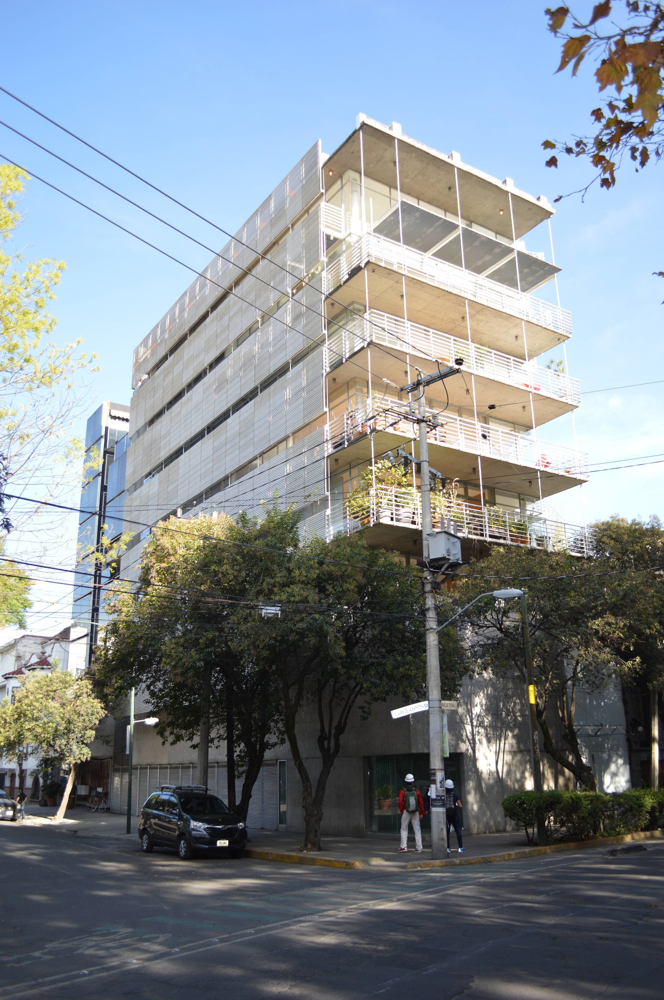

In [47]:
image = batch["original_images"][0]
Image.fromarray(image)

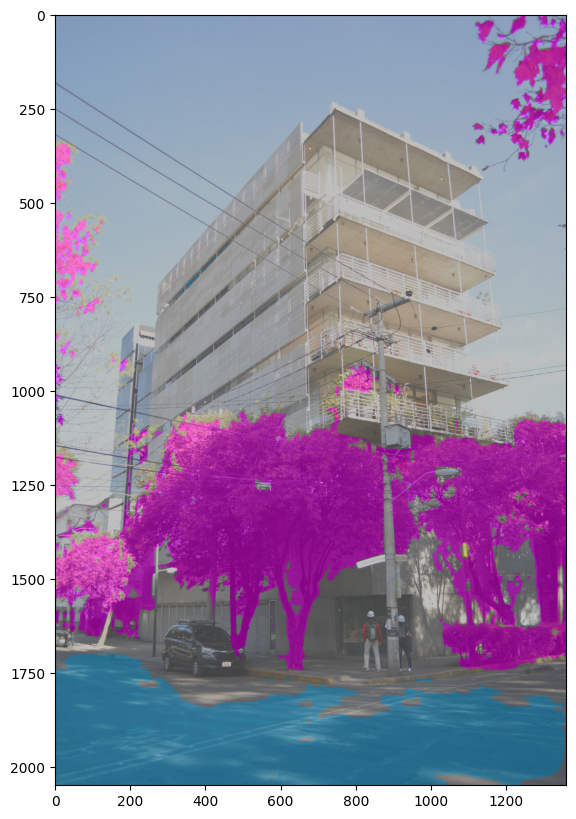

In [48]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

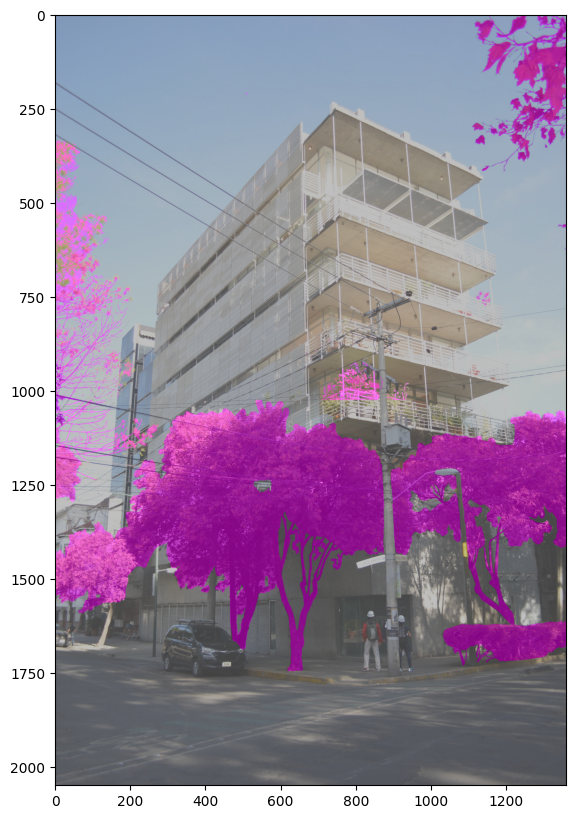

In [49]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = batch["original_segmentation_maps"][0]

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()